# MSIN0143 Programming for Business Analytics

## Group BA_B2: Predicting Regional World Happiness Scores Based on Major Indicators

Team Members: 

Ahmada Shidqan (23186123)

Kimberly Low (23123658)

Raghav Gupta (23196602)

Yingming Yu (23070068)

Word Count: 1927

Date: 09/12/2023

#  Table of Contents:
* [Section 1:Introduction](#1.-Introduction)
   * [1.1 Background](#1.1-Background)
   * [1.2 Objectives](#1.2-Objective)
* [Section 2:Data Pre-Processing](#2.-Data-Pre-Processing)
    * [2.1 Data Collection](#2.1-Data-Collection)
    * [2.2 Data Cleaning](#2.2-Data-Cleaning)
        * [2.2.1 Data Organisation](#2.2.1-Data-Organisation)
        * [2.2.2 Merging Data](#2.2.2-Merging-Data)
    * [2.3 Handling Missing Values](#2.3-Handling-Missing-Values)
* [Section 3:Descriptive Statistics & Exploratory Data Analysis](#3.-Descriptive-Statistics-&-Exploratory-Data-Analysis)
     * [3.1 Data Description ](#3.1-Data-Description)
     * [3.2 Handling Outliers](#3.2-Handling-Outliers)
     * [3.3 Time-Series Analysis](#3.3-Time-Series-Analysis)
     * [3.4 Scatterplots ](#3.4-Scatterplots)
* [Section 4: Predictive Models](#4.-Predictive-Models)
  * [4.1 Feature Selection](#4.1-Feature-Selection)
  * [4.2 Linear Regression](#4.2-Linear-Regression)
     * [4.2.1 Modelling Asia vs. Southern Asia](#4.2.1-Modelling-Asia-vs.-Southern-Asia)
     * [4.2.2 Modelling Africa vs. Southern Africa](#4.2.2-Modelling-Africa-vs.-Southern-Africa)
  *  [4.3 Random Forest](#4.3-Random-Forest)
     * [4.3.1 Modelling Asia vs. Southern Asia](#4.2.1-Modelling-Asia-vs.-Southern-Asia)
     * [4.3.2 Modelling Africa vs. Southern Africa](#4.2.2-Modelling-Africa-vs.-Southern-Africa)
* [Section 5: Conclusion](#5.-Conclusion)
  * [5.1 Summary ](#5.1-Summary)
  * [5.2 Limitations & Next Steps](#5.2-Limitations-&-Next-Steps)
* [Section 6: Appendix](#6.-Appendix)
  * [6.1 Additional Visualisations](#6.1-Additional-Visualisations)
  * [6.2 Word Count](#6.2-Word-Count)
* [Section 7: References](#7.-References)
* [Section 8: Trello Screenshots](#8.-Trello-Screenshots)

Note: Generative AI was used to understand concepts and assist in writing code. Any ideas, work flow, insights, and interpretations are original to the authors

# 1. Introduction

## 1.1 Background

The World Happiness Index (WHI) is the definitive measure of a country’s happiness. Developed by the UN in 2012, the WHI quantifies the average quality of life for citizens of a nation on a scale of 0 to 100 (Helliwell et al., 2023). Scores are generated based on an average of survey responses where participants rank their quality of life on different dimensions. 

The UN has also developed a method to anticipate annual WHI scores. Through extensive research, they identified six major constructs  (indicators) correlated with the WHI: economy, family, health, freedom, generosity, and corruption. While the economy is measured through GDP per capita, other indicators do not have concrete metrics defining them. Instead, the UN uses additional surveys to measure them.  Additionally, as the UN only uses one measure for each indicator, we not sure if it is enough to accurately capture the construct. Furthermore, the UN applies the same predictive model to all countries, but we believe the importance of each indicator may differ between countries.  

## 1.2 Objective 

Our objective is to build a personalised predictive model using additional indicators, including the published available quantitative metrics, under the different UN indicators, to predict a country’s world happiness index. We will build the case for developing personalised models on a regional basis. 

# 2. Data Pre-Processing 

In [51]:
## Prepping the notebook by importing relevant packages ahead of time 
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from IPython.display import Image
!pip install statsmodels

/bin/bash: /opt/anaconda/envs/Python3/lib/libtinfo.so.6: no version information available (required by /bin/bash)

         .:::.     .::.       
        ....yy:    .yy.       
        :.  .yy.    y.        
             :y:   .:         
             .yy  .:          
              yy..:           
              :y:.            
              .y.             
             .:.              
        ....:.                
        :::.                  

• Project files and data should be stored in /project. This is shared among everyone
  in the project.
• Personal files and configuration should be stored in /home/faculty.
• Files outside /project and /home/faculty will be lost when this server is terminated.
• Create custom environments to setup your servers reproducibly.

bash: /opt/anaconda/envs/Python3/lib/libtinfo.so.6: no version information available (required by bash)


## 2.1 Data Collection

For each indicator, we sourced multiple metrics that we thought sufficiently captured the construct. We collected data for as many countries as possible over a time frame of 10 years, starting in 2011. A brief overview of the datasets is given below:

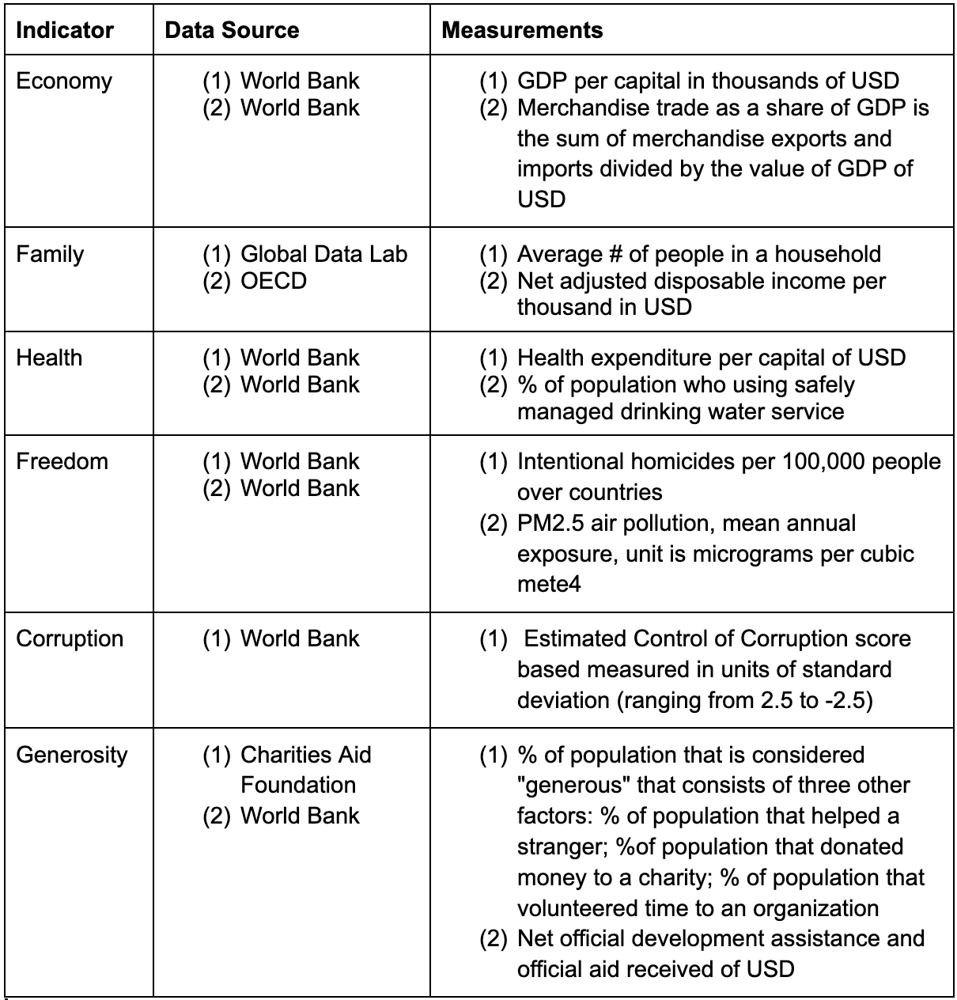

In [52]:
Image("Screen Shot 2023-12-09 at 15.11.43.png")

## 2.2 Data Cleaning

We sourced, cleaned and edited each dataset.

### 2.2.1 Data Organisation

In [53]:
## Cleaning World Happiness Index data

# Since we predicted that country names between subsequent data sets would be inconsistent, we used country code,
# a unique 3 letter code, as our country identifier instead.
# We also expanded the data set using the melt method to make it easier to merge.

# importing dataset
WHR_scores = pd.read_csv('WHR - Happiness Scores.csv')

# coverting data types to be able to concatenate
WHR_scores['Year'] = WHR_scores['Year'].astype(str)
WHR_scores['Country code'] = WHR_scores['Country code'].astype(str)

# adding new column for country year
WHR_scores ['country_year'] = WHR_scores['Country code'] + '_' + WHR_scores['Year']

# reindexing new column within the dataframe 
columns = WHR_scores.columns.tolist()
WHR_scores = WHR_scores.reindex(columns=columns)
whi = WHR_scores[['country_year','Country code','Year','Life Ladder']]
whi.columns = ['country_year','Country Code','year','world_happiness_index']
whi['year'] = whi['year'].astype(int)

## Now each row should be a unique country and year combination with the column representing the WHI.

/tmp/ipykernel_224/1838393661.py:22: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [54]:
## Importing Indicator Datasets

# a: Economy
a_gdp = pd.read_csv('a_gdp_per_capita.csv')
a_merchandise = pd.read_csv("a_merchandise_trade.csv",skiprows=3,usecols=[2]+list(range(56,68)))

# b: Family
b_household_income = pd.read_csv('b_household_disposable_income.csv')
b_household_size = pd.read_csv('b_average_household_size.csv')

# c: Health
c_health_expenditure_per_capita = pd.read_csv("c_health_expenditure_per_capita.csv",skiprows=4,usecols=[2]+ list(range(56,68)),dtype={"country_index":str})
c_safe_drinking_water = pd.read_csv("c_safe_drinking_water.csv",skiprows=4,usecols=[2]+list(range(56,68)))

# d: Freedom
d_crime = pd.read_csv("d_intentional_homicides.csv",skiprows=4,usecols=[2]+list(range(56,68)))
d_pollution = pd.read_csv("d_pm2.5_pollution.csv",skiprows=3,usecols=[2]+list(range(56,68)))

# e: Corruption
e_corruption = pd.read_csv('e_WGI_estimates.csv', skiprows=1,usecols=[2]+list(range(6,16)))

# f: Generosity
f_oda = pd.read_csv("f_oda.csv",skiprows=4,usecols=[2]+list(range(56,68)))
f_wgi = pd.read_csv("f_wgi.csv",usecols=[0]+list(range(2,7)))

# Import ISO3166 containing official code of countries as master data to join
code_countries = pd.read_csv("iso3166_countries.csv", dtype={"Numeric": str})

# Import M49 containing regions and sub-regions
code_regions_raw = pd.read_csv("m49_regions_subregions.csv")

a. Economy

In [55]:
## GDP per Capita

# Following the UN, we used GDP per capita (measured in current USD),
#since we believe it is a direct indication of the economy.

# Subsetting data to only relevant columns
a_gdp_sub = a_gdp[['Country Code', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']]

# Re-arranging data set using melt method
gdp = a_gdp.melt(id_vars = ['Country Code', 'Country Name'], 
        value_vars = ['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
        var_name = 'year',
        value_name = 'gdp_per_capita')

# Creating new column with unique ID
gdp['country_year'] = gdp['Country Code'] + '_' + gdp['year']
gdp['year'] = gdp['year'].astype(int)

# Subsetting data
a_gdp = gdp[['country_year', 'Country Code', 'year', 'gdp_per_capita']]

In [56]:
## Merchandise Trade

# Merchandise trade is the ratio of exports and imports compared to GDP. 
# The greater the ratio, the better the country's foreign trade is and the greater ability its inhabitants have to buy products from other countries.

# transform into panel data
a_merchandise = a_merchandise.melt(id_vars='Country Code', var_name='year',value_name='merchandise_trade')

# unique ID
a_merchandise['country_year'] = a_merchandise['Country Code'] + '_' + a_merchandise['year'].astype(str)

# changing data type of year
a_merchandise['year'] = a_merchandise['year'].astype(int)

b. Family

In [57]:
## Average Disposable Household Income (in current USD)

# We think income per household could be a good indicator of well-being in a family.

# Creating a new column in household income merging country code with year
b_household_income["country_year"] = b_household_income['LOCATION'] + "_" + b_household_income['TIME'].astype(str)

# Subsetting to relevant columns
b_household_income = b_household_income[['country_year', 'LOCATION', 'TIME', 'Value']].copy()
b_household_income.columns = ['country_year', 'Country Code', 'year', 'household_income']

b_household_income['year'] = b_household_income['year'].astype(int)

In [58]:
## Average Household Size (in number of people)

# We wonder if the size of the household can affect happiness.

# subset to 10 years
b_household_size_sub = b_household_size[['ISO_Code', 'Country', '2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022']].copy()

# expanding using melt
household_size = b_household_size_sub.melt(id_vars = ['ISO_Code', 'Country'], 
        value_vars = ['2012', '2013', '2014', '2015', '2016', '2017', '2018', '2019', '2020', '2021', '2022'],
        var_name = 'year',
        value_name = 'avg_household_size')

# creating our unique ID column combining country and year
household_size['country_year'] = household_size['ISO_Code'] + '_' + household_size['year']

# subsetting relevant columns
b_household_size = household_size[['country_year', 'ISO_Code', 'year', 'avg_household_size']]

b_household_size['year'] = b_household_size['year'].astype(int)
b_household_size.rename(columns = {'ISO_Code':'Country Code'}, inplace = True) # rename column

/tmp/ipykernel_224/523884693.py:20: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_224/523884693.py:21: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



c. Health

In [59]:
## Health expenditure (in current USD)

# Health expenditure may correlate with quality of healthcare services in a nation.

# melting
c_health_expenditure_per_capita = c_health_expenditure_per_capita.melt(id_vars='Country Code', var_name='year',value_name='health_expenditure_per_capita')

# creating unique ID
c_health_expenditure_per_capita['country_year'] = c_health_expenditure_per_capita['Country Code'] + '_' + c_health_expenditure_per_capita['year'].astype(str)

# changing data type of year
c_health_expenditure_per_capita['year']=c_health_expenditure_per_capita['year'].astype(int)

In [60]:
## Percentage of population with access to safe drinking water services

# Safe drinking water is a necessity.

# Expanding data
c_safe_drinking_water = c_safe_drinking_water.melt(id_vars=['Country Code'], var_name='year',value_name='safe_drinking_water')

# Creating unique ID
c_safe_drinking_water['country_year'] = c_safe_drinking_water['Country Code'] + '_' + c_safe_drinking_water['year'].astype(str)

# Changing data type of year
c_safe_drinking_water['year']=c_safe_drinking_water['year'].astype(int)

d. Freedom

In [61]:
## Intentional Homicides

# Intentional homicides are related to the degree of legal regulation
# The higher the crime rate and the more lax the legal regulation, the more freedom people enjoy. 

# Transform into panel data
d_crime = d_crime.melt(id_vars=['Country Code'], var_name='year',value_name='intentional_homicides')

# Unique ID
d_crime['country_year'] = d_crime['Country Code'] + '_' + d_crime['year'].astype(str)

# Changing data type of year
d_crime['year']=d_crime['year'].astype(int)

In [62]:
## PM2.5 Air Pollution

# Measure of a country's air quality.
# Good air quality allows people the freedom to participate in social, economic, and cultural activities. 

# Transform into panel data
d_pollution = d_pollution.melt(id_vars=['Country Code'], var_name='year',value_name='pm2.5_pollution')

#Unique ID
d_pollution['country_year'] = d_pollution['Country Code'] + '_' + d_pollution['year'].astype(str)

# Changing data type of year
d_pollution['year']=d_pollution['year'].astype(int)

e. Corruption

In [63]:
## Corruption Score
# As corruption is a difficult construct to measure we could only find control of corruption scores
# Though this is based on survey responses

# converting into panel (years into columnns)
e_corruption = e_corruption.melt(id_vars=['Country Code'], var_name='Year',
             value_name='corruption_score')

# changing the name of column Year 
e_corruption = e_corruption.rename(columns={'Year': 'year'})

# unique ID
e_corruption['country_year'] = e_corruption['Country Code'] + '_' + e_corruption['year'].astype(str)

# convert year into int
e_corruption['year']=e_corruption['year'].astype(int)

# removing rows that take non-numeric values under WGI column 
e_corruption = e_corruption[pd.to_numeric(e_corruption['corruption_score'], errors='coerce').notnull()]

f. Generosity 

In [64]:
## ODA (net official development assistance and official aid received (current US$)

# import ODA  2011-2021, last updated 26 October 2023, accessed 15 November 2023
f_oda = f_oda.melt(id_vars=['Country Code'], var_name='year',value_name='oda') 

# transform into panel-data
f_oda['country_year'] = f_oda['Country Code'] + '_' + f_oda['year'].astype(str)
f_oda["year"] = f_oda["year"].astype(int)

In [65]:
## World Giving Index
# WGI is easured by the percentage of the population that helped a stranger
# the percentage of the population that donated money to a charity
# and the percentage of the population that volunteered time to an organization.

f_wgi['country_year'] = f_wgi['country_code'] + '_' + f_wgi['year'].astype(str)
f_wgi = f_wgi.rename(columns={'country_code':'Country Code'})

### 2.2.2 Merging Data


After reorganising all the datasets, we merged them into a master dataset and classified countries by regions and subregions.

In [66]:
## Data Joining

# Using 'code_countries' (ISO3166) and 'code_regions' (M49) as master data to join.

# Cleaning the country codes in the 'countries' column (removing extra spaces)
code_regions = code_regions_raw.assign(countries=code_regions_raw['countries'].str.split(', ')).explode('countries')
code_regions['countries'] = code_regions['countries'].str.strip()

# Joining on 'Numeric' from file1 and 'Countries' from file2
code_countries = pd.merge(code_countries, code_regions, left_on='Numeric', right_on='countries', how='left')

# Create an empty DataFrame
all_data = pd.DataFrame(code_countries['Alpha3']).rename(columns={'Alpha3':'Country Code'})
all_data['country_name'] = code_countries['Country']
all_data['region_name'] = code_countries['region_name']
all_data['subregion_name'] = code_countries['subregion_name']
df_years = pd.DataFrame({"year":range(2011,2022)}) # Define years of observation

# Temporary key for cross-join
all_data['key'] = 1
df_years['key'] = 1
all_data = pd.merge(all_data, df_years, on='key').drop('key', axis=1)
all_data['country_year'] = all_data['Country Code'] + '_' + all_data['year'].astype(str)

# Joining with world happiness index
all_data = pd.merge(all_data,whi,on=["country_year", "Country Code", "year"],how="left")

# a. Joining with Economy
all_data = pd.merge(all_data,a_gdp,on=["country_year", "Country Code", "year"],how="left")
all_data = pd.merge(all_data,a_merchandise,on=["country_year","Country Code", "year"],how="left")

# b. Joining with Family
all_data = pd.merge(all_data,b_household_income,on=["country_year", "Country Code", "year"],how="left")
all_data = pd.merge(all_data,b_household_size,on=["country_year", "Country Code", "year"],how="left")

# c. Joining with Health
all_data = pd.merge(all_data,c_health_expenditure_per_capita,on=["country_year","Country Code","year"],how="left")
all_data = pd.merge(all_data,c_safe_drinking_water,on=["country_year","Country Code","year"],how="left")

# d. Joining with Freedom
all_data = pd.merge(all_data,d_crime,on=["country_year","Country Code", "year"],how="left")
all_data = pd.merge(all_data,d_pollution,on=["country_year","Country Code", "year"],how="left")

# e. Joining with Corruption
all_data = all_data = pd.merge(all_data,e_corruption,on=["country_year","Country Code", "year"],how="left")

# f. Joining with Generosity
all_data = pd.merge(all_data,f_oda,on=["country_year","Country Code", "year"],how="left")
all_data = pd.merge(all_data,f_wgi,on=["country_year","Country Code", "year"],how="left")

In [67]:
## A brief look at our final dataset
all_data.head()

,Country Code,country_name,region_name,subregion_name,year,country_year,world_happiness_index,gdp_per_capita,merchandise_trade,household_income,...,health_expenditure_per_capita,safe_drinking_water,intentional_homicides,pm2.5_pollution,corruption_score,oda,world_giving_index_percentage,helped_stranger_percentage_of_adults,donated_money_percentage,volunteered_percentage_of_adults
0,AFG,Afghanistan,Asia,Southern Asia,2011,AFG_2011,3.832,NaN,37.882591,NaN,...,52.363049,20.212884,4.208668,56.247228,NaN,6.745740e+09,0.35,0.57,0.29,0.20
1,AFG,Afghanistan,Asia,Southern Asia,2012,AFG_2012,3.783,663.141053,47.011487,NaN,...,52.613541,21.123996,6.393913,54.700233,NaN,6.666770e+09,0.35,0.51,0.33,0.21
2,AFG,Afghanistan,Asia,Southern Asia,2013,AFG_2013,3.572,651.987862,44.100301,NaN,...,56.305542,22.034470,NaN,58.791659,-1.445908,5.152540e+09,0.40,0.62,0.41,0.17
3,AFG,Afghanistan,Asia,Southern Asia,2014,AFG_2014,3.131,628.146804,40.383283,NaN,...,60.189579,22.944301,NaN,61.865329,-1.364743,4.942970e+09,0.28,0.45,0.24,0.15
4,AFG,Afghanistan,Asia,Southern Asia,2015,AFG_2015,3.983,592.476165,41.473850,NaN,...,60.058540,23.853590,9.975262,60.597015,-1.354240,4.274230e+09,0.30,0.51,0.28,0.09


## 2.3 Handling Missing Values

In [68]:
## Checking for the proportion of null values per variable:
all_data.isnull().mean().round(2)

Country Code                            0.00
country_name                            0.00
region_name                             0.00
subregion_name                          0.00
year                                    0.00
country_year                            0.00
world_happiness_index                   0.41
gdp_per_capita                          0.23
merchandise_trade                       0.18
household_income                        0.78
avg_household_size                      0.70
health_expenditure_per_capita           0.29
safe_drinking_water                     0.41
intentional_homicides                   0.44
pm2.5_pollution                         0.33
corruption_score                        0.30
oda                                     0.49
world_giving_index_percentage           0.47
helped_stranger_percentage_of_adults    0.47
donated_money_percentage                0.47
volunteered_percentage_of_adults        0.47
dtype: float64

Since the 'world_happiness_index' is the most important column in our analysis, we removed all rows with any null values.

In [69]:
all_data = all_data.dropna(subset=['world_happiness_index'])

For our predictors, dropping rows with any null values would leave us with too few observations, so we imputed missing values instead. 

In [70]:
# First, we prioritise forward then backward filling values for the same country. 
# Where there is no data for this, we used the median values for the same subregion for the same year.
# Then only for the same subregion if the same year is not available. 

# Helper function to fill NaN with forward and backward fill for the same country_name and year
def fill_by_country_year(df):
    df = df.sort_values(by=['country_name', 'year'])  # Sort by country_name and year for backward filling
    group_columns = ['country_name', 'year']
    df[group_columns] = df[group_columns].ffill().bfill()  # Forward fill to handle the first entry if it's NaN
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.difference(group_columns)
    df[numeric_cols] = df.groupby(group_columns)[numeric_cols].apply(lambda group: group.bfill())
    return df

# Function to fill NaN with median from the same subregion_name and year
def fillna_with_group_median(df, group_columns):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.difference(group_columns)
    group_medians = df.groupby(group_columns)[numeric_cols].transform('median')
    for col in numeric_cols:
        df[col] = df[col].fillna(group_medians[col])
    return df

# Function to fill NaN with median from the same subregion_name
def fillna_with_region_median(df, group_column):
    numeric_cols = df.select_dtypes(include=['float64', 'int64']).columns.difference([group_column])
    region_medians = df.groupby(group_column)[numeric_cols].transform('median')
    for col in numeric_cols:
        df[col] = df[col].fillna(region_medians[col])
    return df

# Applying the filling strategy
# Step 1: Forward-backward fill for the same country_name and year
all_data_filled = fill_by_country_year(all_data.copy())

# Step 2: Fill NaN with median from the same subregion_name and year
all_data_filled = fillna_with_group_median(all_data_filled, ['subregion_name', 'year'])

# Step 3: Fill NaN with median from the same subregion_name
all_data_filled = fillna_with_region_median(all_data_filled, 'subregion_name')

/tmp/ipykernel_224/387115521.py:11: FutureWarning:

Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)



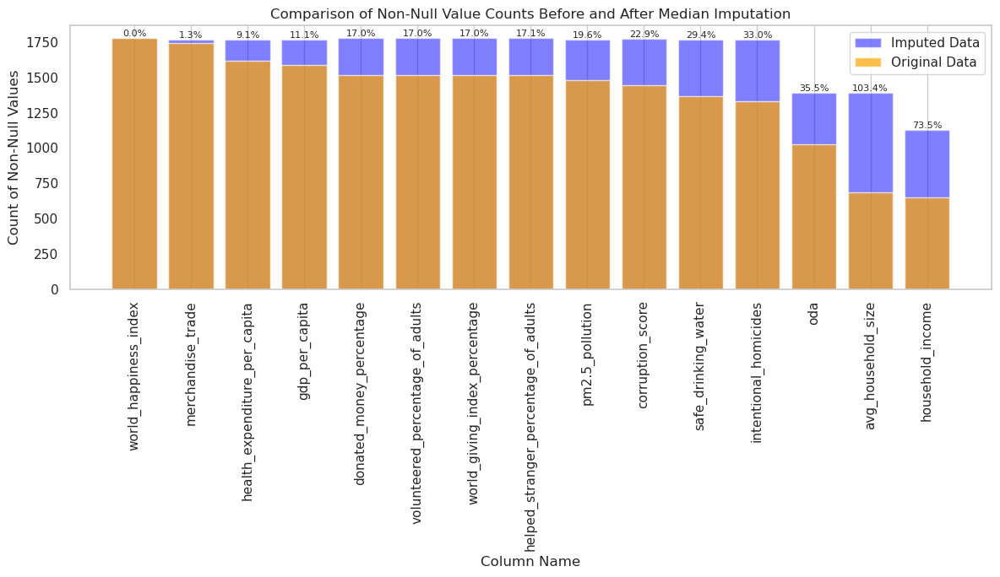

In [71]:
## Comparing the amount of filled vs original data for each predictor:

# Exclude the specified columns from the count
columns_to_exclude = ['Country Code', 'country_name', 'country_year', 'year', 'region_name', 'subregion_name']
filtered_columns = all_data.columns.difference(columns_to_exclude)

# Calculate the non-null counts for the remaining columns only
non_null_counts = all_data[filtered_columns].notnull().sum()
non_null_counts_filled = all_data_filled[filtered_columns].notnull().sum()

# Calculate the percentage of imputed values
imputed_percentage = ((non_null_counts_filled - non_null_counts) / all_data.count()) * 100

# Sort the bars using the non-null values of original data in descending order
sorted_indices = non_null_counts.sort_values(ascending=False).index
non_null_counts = non_null_counts[sorted_indices]
non_null_counts_filled = non_null_counts_filled[sorted_indices]
imputed_percentage = imputed_percentage[sorted_indices]

# Create the bar chart for the non-null counts of the filtered columns
plt.figure(figsize=(12, 7))  # Set the figure size
bars = plt.bar(non_null_counts_filled.index, non_null_counts_filled.values, color='blue', alpha=0.5, label='Imputed Data')  # Imputed non-null counts
plt.bar(non_null_counts.index, non_null_counts.values, color='orange', alpha=0.7, label='Original Data')  # Original non-null counts

# Adding the percentage of imputed values on top of the bars
for bar, percentage in zip(bars, imputed_percentage):
    yval = bar.get_height()
    plt.text(bar.get_x() + bar.get_width()/2, yval, f'{percentage:.1f}%', va='bottom', ha='center', fontsize=8)

plt.title('Comparison of Non-Null Value Counts Before and After Median Imputation')  # Set the title of the bar chart
plt.xlabel('Column Name')  # Set the x-axis label
plt.ylabel('Count of Non-Null Values')  # Set the y-axis label
plt.xticks(rotation=90)  # Rotate the x-axis labels for readability
plt.grid(axis='y')  # Show grid lines for y-axis only
plt.legend()  # Show the legend
plt.tight_layout()  # Fit the plot neatly
plt.show()  # Display the bar chart


The proportion of imputed values to original values for 'avg_household_size', 'household_income' and 'oda' is high, which may reduce data completeness and change the distribution of the original data. These columns were dropped for this reason. 

In [72]:
# Based on information above, we should proceed to drop columns that are still not fully helped by the imputation.
columns_will_drop = ['avg_household_size','household_income','oda']
all_data_dropped = all_data_filled.drop(columns_will_drop,axis=1)

# Drop rows with missing values
all_data_2 = all_data_dropped.dropna()

## Overall, our cleaned dataset covers 1767 countries and 18 columns.

# 3. Descriptive Statistics & Exploratory Data Analysis 

## 3.1 Data Description

In [73]:
## Summary statistis for cleaned data
all_data_2.describe()

,year,world_happiness_index,gdp_per_capita,merchandise_trade,health_expenditure_per_capita,safe_drinking_water,intentional_homicides,pm2.5_pollution,corruption_score,world_giving_index_percentage,helped_stranger_percentage_of_adults,donated_money_percentage,volunteered_percentage_of_adults
count,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.000000,1767.00000,1767.000000
mean,2015.889078,5.658938,18932.054266,67.939981,1700.846816,69.326216,5.119595,26.489644,0.116081,0.335838,0.489239,0.31144,0.207184
std,3.118667,1.158411,21856.375236,42.480781,2263.608034,30.843078,9.707300,17.498477,1.063859,0.108924,0.122312,0.18551,0.104589
min,2011.000000,2.179000,232.060617,11.147007,12.279884,5.834464,0.000000,5.257788,-1.759068,0.110000,0.120000,0.02000,0.030000
25%,2013.000000,4.810000,2594.295038,41.513794,120.526199,44.543169,0.961140,13.730629,-0.739264,0.257500,0.400000,0.17000,0.130000
50%,2016.000000,5.739000,8377.694887,55.921940,549.474365,79.169533,1.807067,21.677422,-0.134038,0.320000,0.490000,0.26000,0.190000
75%,2019.000000,6.557000,30172.949935,80.175984,2448.441406,98.087764,4.539343,33.635704,0.892669,0.410000,0.570000,0.43000,0.270000
max,2021.000000,7.889000,123678.702100,398.430291,11702.409180,100.000000,106.819604,95.242644,2.399264,0.700000,0.830000,0.92000,0.610000


Plotting the distributions below: 

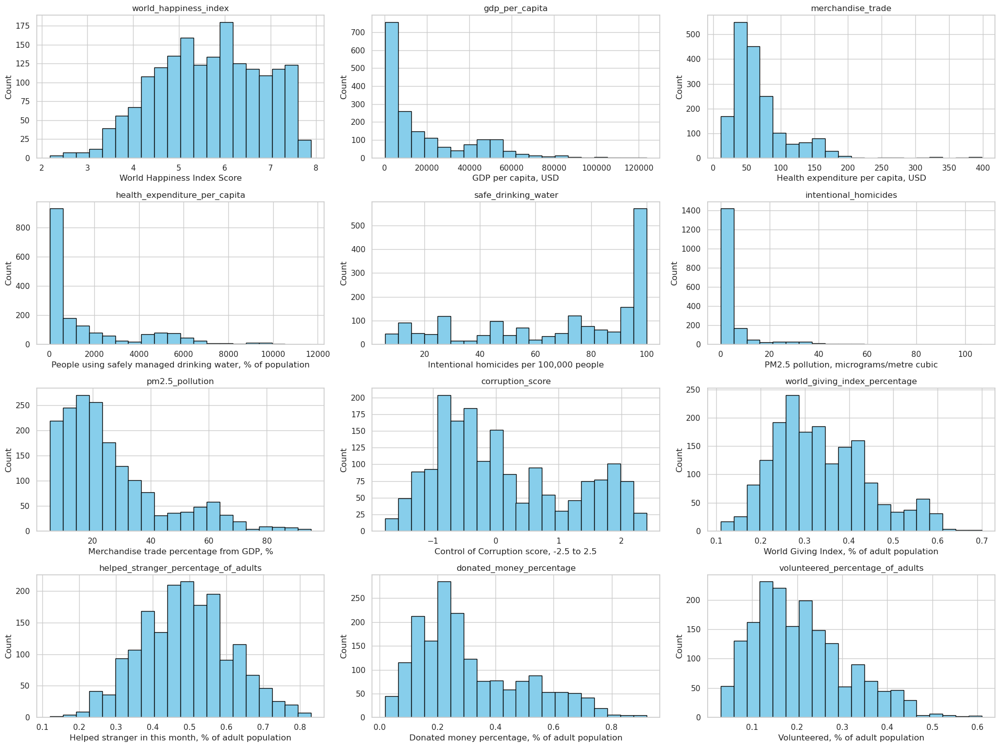

In [74]:
## Histogram Distributions

#set style sheet to standardise visualisations 
plt.style.use('seaborn-muted')

# Exclude object dtype columns and "year" column
numeric_columns = all_data_2.select_dtypes(include=['float64', 'int64']).columns.drop('year', errors='ignore')

# Prepare a 4x3 grid for the histograms
fig, axs = plt.subplots(4, 3, figsize=(20, 15))

# Flatten the Axes array for easy iterating
axs = axs.ravel()

# Plot a histogram for each numeric column
for i, column in enumerate(numeric_columns):
    if i < 12:  # Since we're doing a 4x3 layout, we have space for only 12 histograms
        axs[i].hist(all_data_2[column].dropna(), bins=20, color='skyblue', edgecolor='black')
        axs[i].set_title(column)
    else:
        axs[i].set_visible(False)  # Hide subplot if no more columns

# Add axis labels for each histogram 
axs[0].set_xlabel('World Happiness Index Score')
axs[0].set_ylabel('Count')
axs[1].set_xlabel('GDP per capita, USD')
axs[1].set_ylabel('Count')
axs[2].set_xlabel('Health expenditure per capita, USD')
axs[2].set_ylabel('Count')
axs[3].set_xlabel('People using safely managed drinking water, % of population')
axs[3].set_ylabel('Count')
axs[4].set_xlabel('Intentional homicides per 100,000 people')
axs[4].set_ylabel('Count')
axs[5].set_xlabel('PM2.5 pollution, micrograms/metre cubic')
axs[5].set_ylabel('Count')
axs[6].set_xlabel('Merchandise trade percentage from GDP, %')
axs[6].set_ylabel('Count')
axs[7].set_xlabel('Control of Corruption score, -2.5 to 2.5')
axs[7].set_ylabel('Count')
axs[8].set_xlabel('World Giving Index, % of adult population')
axs[8].set_ylabel('Count')
axs[9].set_xlabel('Helped stranger in this month, % of adult population')
axs[9].set_ylabel('Count')
axs[10].set_xlabel('Donated money percentage, % of adult population')
axs[10].set_ylabel('Count')
axs[11].set_xlabel('Volunteered, % of adult population')
axs[11].set_ylabel('Count')

# Adjust the layout
plt.tight_layout()
plt.show()

WHI mostly follows a normal distribution, skewed to the right, with most countries' WHI clustered around 4 to 7. For 'gdp_per_capita', 'health_expenditure', and 'intentional_homicides', their distributions show a downward trend (the higher the indicator result, the lower the number of countries). For 'safe_drinking_water', the trend is reversed. For the remaining seven indicators, there is nearly normal distribution.

## 3.2 Handling Outliers

Identifying outliers using box-plots:

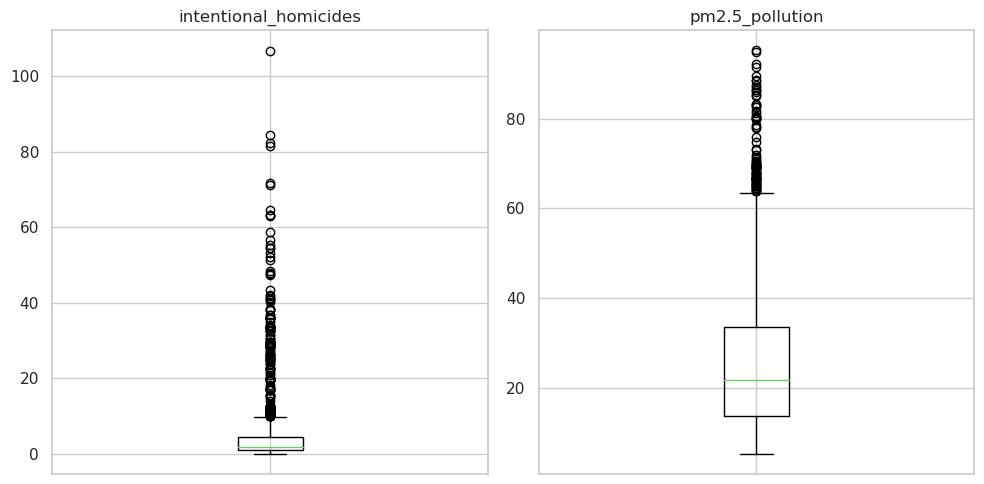

In [75]:
## Box plots to visualise outliers

# Prepare a 1x2 grid for the box plots of specified columns
fig, axs = plt.subplots(1, 2, figsize=(10, 5))  # Adjust the size as needed

# Plot a box plot for each specified column
columns_to_plot = ['intentional_homicides', 'pm2.5_pollution']
for i, column in enumerate(columns_to_plot):
    axs[i].boxplot(all_data_2[column].dropna(), vert=True)
    axs[i].set_title(column)
    axs[i].set_xticklabels([])
# Adjust the layout
plt.tight_layout()
plt.show()

'intentional_homicides' and 'pm2.5_pollution' have the most outliers. However, given that our data is collected from accredited sources, we retained these variables. Additionally, since we had to impute several metrics, we may have introduced some skewness. 

## 3.3 Time Series Analysis

To investigate our data further, we graphed each indicator and made scatterplots to compare them to the WHI. 

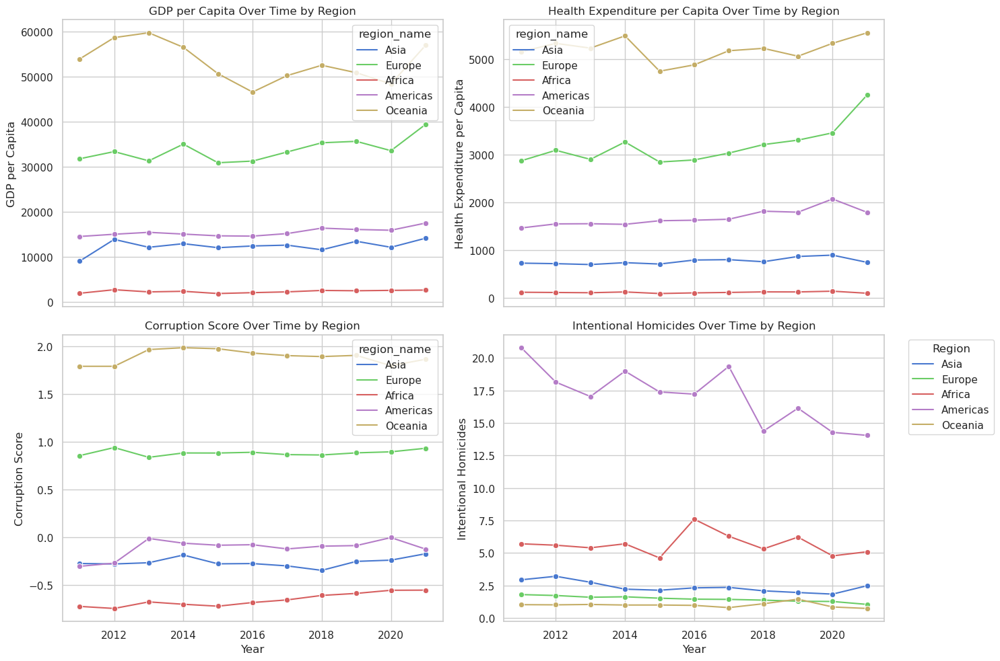

In [76]:
## Looking at time-series graphs:

# Set up a 2x2 grid of plots
fig, axs = plt.subplots(2, 2, figsize=(15, 10), sharex=True)

# Plot 1: GDP per Capita
sns.lineplot(ax=axs[0, 0], data=all_data_2, x='year', y='gdp_per_capita', hue='region_name', marker='o',errorbar=None)
axs[0, 0].set_title('GDP per Capita Over Time by Region')
axs[0, 0].set_ylabel('GDP per Capita')

# Plot 2: Health Expenditure per Capita
sns.lineplot(ax=axs[0, 1], data=all_data_2, x='year', y='health_expenditure_per_capita', hue='region_name', marker='o',errorbar=None)
axs[0, 1].set_title('Health Expenditure per Capita Over Time by Region')
axs[0, 1].set_ylabel('Health Expenditure per Capita')

# Plot 3: Corruption Score
sns.lineplot(ax=axs[1, 0], data=all_data_2, x='year', y='corruption_score', hue='region_name', marker='o',errorbar=None)
axs[1, 0].set_title('Corruption Score Over Time by Region')
axs[1, 0].set_ylabel('Corruption Score')

# Plot 4: Intentional Homicides
sns.lineplot(ax=axs[1, 1], data=all_data_2, x='year', y='intentional_homicides', hue='region_name', marker='o',errorbar=None)
axs[1, 1].set_title('Intentional Homicides Over Time by Region')
axs[1, 1].set_ylabel('Intentional Homicides')

# Set a common X label
for ax in axs.flat:
    ax.set_xlabel('Year')

# Place the legend outside the figure/plot
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust layout
plt.tight_layout()

# Display the plot
plt.show()

Most variables do not vary much over time for most regions. Thus, if the predictors are accurate estimators of the WHI, we should observe a similar trend for WHI. 

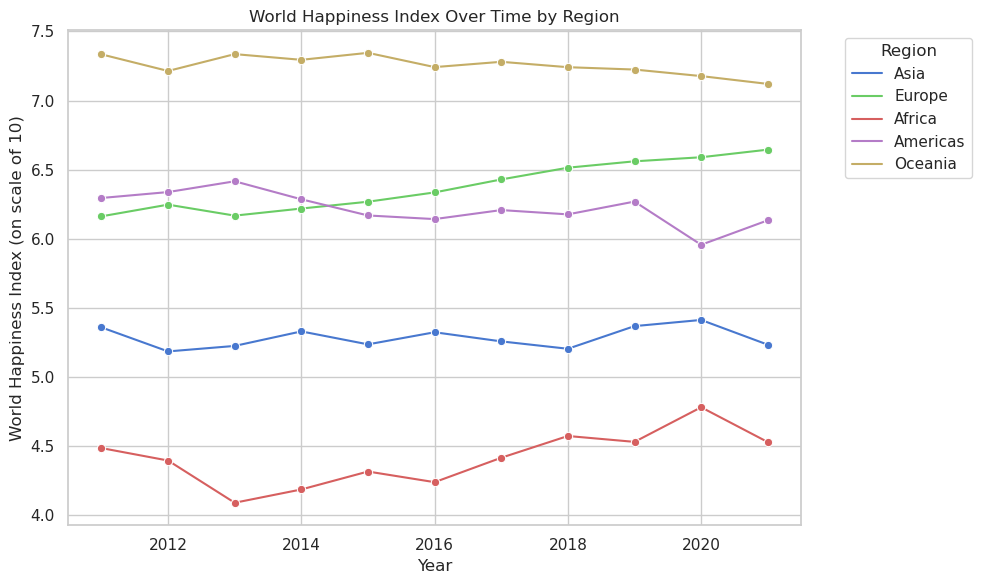

In [77]:
# plot "world_happiness_index" as y and "year" as x, group by "region" as hue/color
plt.figure(figsize=(10, 6))
sns.lineplot(data=all_data_2, x='year', y='world_happiness_index', hue='region_name', marker='o', errorbar=None)

plt.title('World Happiness Index Over Time by Region')
plt.xlabel('Year')
plt.ylabel('World Happiness Index (on scale of 10)')
plt.legend(title='Region', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.tight_layout()
plt.show()

This is largely the case for Oceania and Asia. Europe’s average WHI steadily increases over time. Africa’s WHI also increases, but with more fluctuations. Conversely, Americas' WHI decreases over time. Also, Oceania has the highest WHI index followed by Europe and the Americas. Given that each continent has a different number of countries within it, some of the variations in the WHI can be explained by relative size. Oceania only has a handful of countries so they are more likely to be similar. 

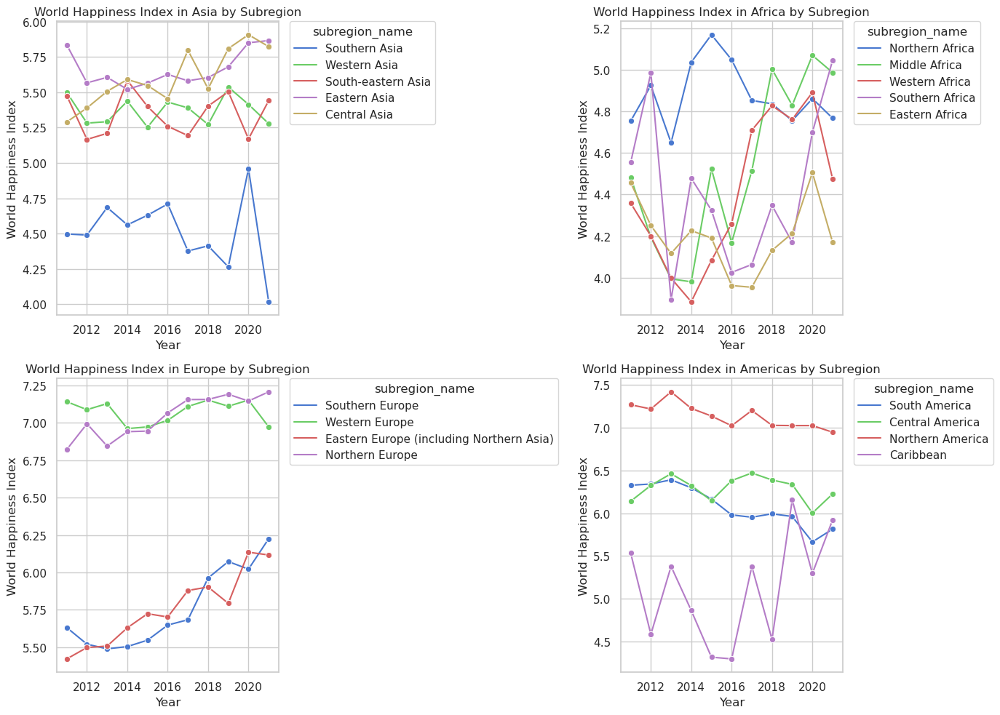

In [78]:
## Graphing WHI over time in each subregion (except for Oceania):

asia_all_data_2 = all_data_2[all_data_2['region_name'] == 'Asia']
africa_all_data_2 = all_data_2[all_data_2['region_name'] == 'Africa']
europe_all_data_2 = all_data_2[all_data_2['region_name'] == 'Europe']
americas_all_data_2 = all_data_2[all_data_2['region_name'] == 'Americas']

# Set up the matplotlib figure with 4 subplots
fig, axs = plt.subplots(2, 2, figsize=(14, 10))

# Define a custom function to plot the lineplot for each region and handle legends
def plot_region(data, ax, region_name, x='year', y='world_happiness_index', hue='subregion_name'):
    sns.lineplot(ax=ax, data=data, x=x, y=y, hue=hue, marker='o', errorbar=None)
    ax.set_title(f'World Happiness Index in {region_name} by Subregion')
    ax.set_xlabel('Year')
    ax.set_ylabel('World Happiness Index')
    # Place the legend outside the subplot
    ax.legend(title=hue, bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)

# Plot for each region without confidence intervals
plot_region(asia_all_data_2, axs[0, 0], 'Asia')
plot_region(africa_all_data_2, axs[0, 1], 'Africa')
plot_region(europe_all_data_2, axs[1, 0], 'Europe')
plot_region(americas_all_data_2, axs[1, 1], 'Americas')

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()

Here, we see that there are variations within regions. So generalised trends, and a generalised WHI model, may not paint a representative picture for individual countries. To develop this idea, we have considered separate models for subregions where the variance significantly differs from the regional average. In our case, Southern Asia and Southern Africa.

## 3.4 Scatterplots

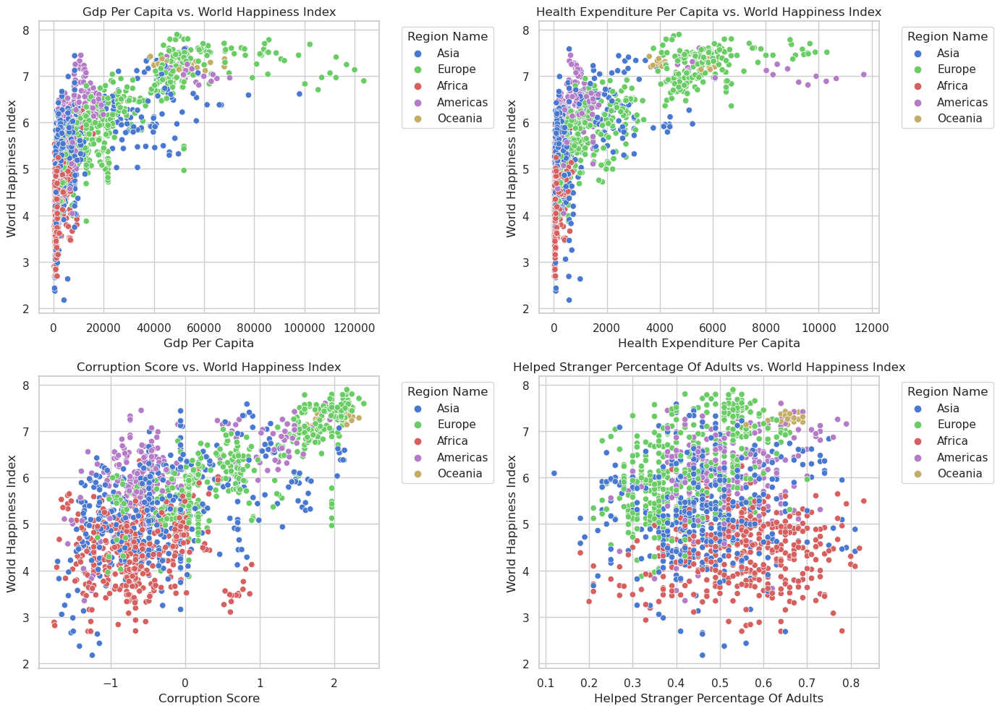

In [79]:
## Scatter plots to gauge the correlation between each indicator and the WHI:

# Define the list of columns to plot against world_happiness_index
columns_to_plot = [
    'gdp_per_capita', 
    'health_expenditure_per_capita', 
    'corruption_score', 
    'helped_stranger_percentage_of_adults'
]

# Set up the matplotlib figure
fig, axs = plt.subplots(2, 2, figsize=(14, 10))  # Prepare a 2x2 grid
# Flatten the Axes array for easy iterating
axs = axs.ravel()

# Generate a scatter plot for each specified column
for i, column in enumerate(columns_to_plot):
    sns.scatterplot(ax=axs[i], data=all_data_2, x=column, y='world_happiness_index', hue='region_name')
    axs[i].set_title(f'{column.replace("_", " ").title()} vs. World Happiness Index')
    axs[i].set_xlabel(column.replace("_", " ").title())
    axs[i].set_ylabel('World Happiness Index')
    axs[i].legend(title='Region Name', bbox_to_anchor=(1.05, 1), loc='upper left')

# Adjust the layout
plt.tight_layout()
plt.show()

## Note that we took the logarithm for some large values to make the scale nicer.

'gdp_per_capita' shows the greatest positive correlation with the WHI, suggesting a healthy economy is a strong determinant of happiness. This seems to be true for every region. 'health_expenditure' and 'corruption' graphed against WHI show a similar relationship. The indicator with the least distinguishable pattern when compared to WHI, was 'helped_stranger_percentage_of_adults'. The scatterplot produces a large cluster but we noticed groupings among regions. 

# 4. Predictive Models

## 4.1 Feature Selection

Mapping a correlation matrix:

In [80]:
# Set up filtered columns
dropping_columns = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage', 'world_giving_index_percentage','world_happiness_index']
all_data_2_filtered = all_data_2.drop(dropping_columns, axis=1)
all_data_2_filtered = all_data_2_filtered.iloc[:,0:10]

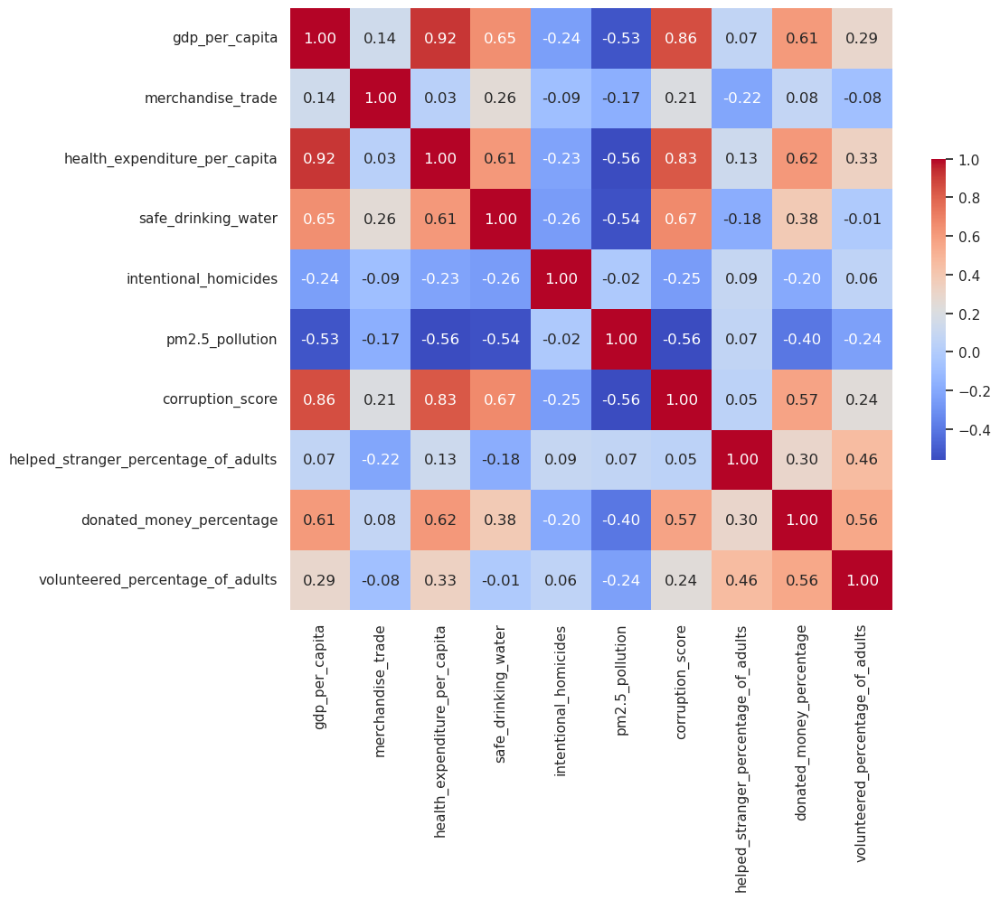

In [81]:
# Calculate the correlation matrix
corr_matrix = all_data_2_filtered.corr()

# Set up the matplotlib figure
plt.figure(figsize=(12, 10))

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap='coolwarm', square=True, cbar_kws={"shrink": .5})

# Adjust the layout and display the plot
plt.tight_layout()
plt.show()

The correlation matrix further evidences that WHI has a strong correlation with 'gdp_per_capita', 'health_expenditure', 'corruption', and 'safe_drinking_water'. We observe correlations between independent variables indicating multicollinearity. This is unsurprising because we have included multiple metrics to cover different aspects of the same indicator. We also see correlations variables that measure different indicators, which we will control for during our modelling. 

## 4.2 Linear Regression

Similar to the UN, we used a regression to predict WHI with our own basket of variables. Given the possibility of multicollinearity, we ran a lasso regression instead of a standard OLS. Lasso regressions can shrink or remove unimportant coefficients, preventing overfitting and increasing model simplicity.

For our model, we focused on Asia and Africa as they had the lowest WHI scores but show sufficient variation at the sub-region level. Both are emerging economies that contrast with the mature markets in the Americas and Europe, providing a canvas to examine growth trajectories and policy effectiveness.

In [82]:
## Proceeding with a lasso regression on Asia and Africa:

# Import packages
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.preprocessing import StandardScaler
import statsmodels.api as sm

# Dropping columns that are not needed (percent-change of variables)
all_data_3 = all_data_2.iloc[:, 0:18]
all_data_3

,Country Code,country_name,region_name,subregion_name,year,country_year,world_happiness_index,gdp_per_capita,merchandise_trade,health_expenditure_per_capita,safe_drinking_water,intentional_homicides,pm2.5_pollution,corruption_score,world_giving_index_percentage,helped_stranger_percentage_of_adults,donated_money_percentage,volunteered_percentage_of_adults
0,AFG,Afghanistan,Asia,Southern Asia,2011,AFG_2011,3.832,1605.458459,37.882591,52.363049,20.212884,4.208668,56.247228,-0.801387,0.35,0.57,0.29,0.200
1,AFG,Afghanistan,Asia,Southern Asia,2012,AFG_2012,3.783,663.141053,47.011487,52.613541,21.123996,6.393913,54.700233,-0.801387,0.35,0.51,0.33,0.210
2,AFG,Afghanistan,Asia,Southern Asia,2013,AFG_2013,3.572,651.987862,44.100301,56.305542,22.034470,2.929241,58.791659,-1.445908,0.40,0.62,0.41,0.170
3,AFG,Afghanistan,Asia,Southern Asia,2014,AFG_2014,3.131,628.146804,40.383283,60.189579,22.944301,2.748976,61.865329,-1.364743,0.28,0.45,0.24,0.150
4,AFG,Afghanistan,Asia,Southern Asia,2015,AFG_2015,3.983,592.476165,41.473850,60.058540,23.853590,9.975262,60.597015,-1.354240,0.30,0.51,0.28,0.090
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3009,ZWE,Zimbabwe,Africa,Eastern Africa,2017,ZWE_2017,3.638,1192.107012,48.592852,92.254311,26.944588,5.037985,22.582451,-1.298485,0.32,0.66,0.10,0.210
3010,ZWE,Zimbabwe,Africa,Eastern Africa,2018,ZWE_2018,3.616,2269.177012,30.588999,114.633598,26.807938,4.876369,22.085555,-1.246001,0.30,0.61,0.10,0.180
3011,ZWE,Zimbabwe,Africa,Eastern Africa,2019,ZWE_2019,2.694,1421.868596,41.617361,54.808506,26.683978,5.145035,20.834700,-1.271190,0.29,0.55,0.10,0.210
3012,ZWE,Zimbabwe,Africa,Eastern Africa,2020,ZWE_2020,3.160,1372.696674,43.691919,50.676510,26.573846,4.977770,27.230069,-1.287992,0.32,0.56,0.19,0.235


### 4.2.1 Modelling Asia vs. Southern Asia 

In [83]:
# Function to preprocess data
def preprocess_data(data, target, non_numeric_cols):
    data_numeric = data.drop(non_numeric_cols, axis=1)
    y = data_numeric[target]
    X = data_numeric.drop(target, axis=1)
    return train_test_split(X, y, test_size=0.3, random_state=123)

# Function to standardize data
def standardize_data(X_train, X_test):
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    # Convert the scaled arrays back into DataFrames with the original indices
    X_train_scaled_df = pd.DataFrame(X_train_scaled, columns=X_train.columns, index=X_train.index)
    X_test_scaled_df = pd.DataFrame(X_test_scaled, columns=X_test.columns, index=X_test.index)
    
    # Add a constant to the scaled features for the intercept
    X_train_scaled_df = sm.add_constant(X_train_scaled_df)
    X_test_scaled_df = sm.add_constant(X_test_scaled_df)
    
    return X_train_scaled_df, X_test_scaled_df

# Function to perform Lasso regression and return coefficients and performance metrics
def perform_lasso(X_train, y_train, X_test, y_test, alpha=0.1):
    model = sm.OLS(y_train, X_train).fit_regularized(method='elastic_net', alpha=alpha, L1_wt=1.0)
    y_pred = model.predict(X_test)
    mse = mean_squared_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    return model.params, mse, r2

# Initialize DataFrame for coefficients and metrics
coefficients_summary = pd.DataFrame()
performance_metrics = pd.DataFrame(columns=['MSE', 'R-squared'])

# Prepare data
target = 'world_happiness_index'
non_numeric_cols = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage']

# Apply for both Asia and Africa
for region in ['Asia', 'Africa']:
    region_data = all_data_3[all_data_3['region_name'] == region]
    X_train, X_test, y_train, y_test = preprocess_data(region_data, target, non_numeric_cols)
    X_train_scaled, X_test_scaled = standardize_data(X_train, X_test)

    # Perform Lasso for the entire region
    params, mse, r2 = perform_lasso(X_train_scaled, y_train, X_test_scaled, y_test)
    coefficients_summary[region], performance_metrics.loc[region] = params, [mse, r2]

    # Perform Lasso for each subregion
    for subregion in region_data['subregion_name'].unique():
        subregion_data = region_data[region_data['subregion_name'] == subregion]
        X_train_sub, X_test_sub, y_train_sub, y_test_sub = preprocess_data(subregion_data, target, non_numeric_cols)
        X_train_sub_scaled, X_test_sub_scaled = standardize_data(X_train_sub, X_test_sub)

        params_sub, mse_sub, r2_sub = perform_lasso(X_train_sub_scaled, y_train_sub, X_test_sub_scaled, y_test_sub)
        coefficients_summary[subregion], performance_metrics.loc[subregion] = params_sub, [mse_sub, r2_sub]

# Display Asia summary
print("Asia Lasso Coefficients:")
display(coefficients_summary.iloc[:,0:6])
print("\nMSE and R-squared for Each Model:")
display(performance_metrics.iloc[0:6,:])

Asia Lasso Coefficients:


,Asia,Southern Asia,Western Asia,South-eastern Asia,Eastern Asia,Central Asia
const,5.132849,4.419327,5.105607,5.148286,5.594273,5.471162
gdp_per_capita,0.356137,0.000000,0.460951,0.000000,0.000000,0.000000
merchandise_trade,0.000000,0.000000,0.035173,0.000000,0.000000,-0.013308
health_expenditure_per_capita,0.000000,0.000000,0.090709,0.000000,0.056616,0.000000
safe_drinking_water,0.110657,0.000000,0.051847,0.178258,0.000000,0.070299
intentional_homicides,0.000000,-0.007481,0.000000,-0.015415,0.000000,0.000000
pm2.5_pollution,-0.012683,0.000000,0.000000,-0.064337,-0.146399,0.000000
corruption_score,0.000000,0.113119,0.233425,0.216613,0.000000,0.083708
helped_stranger_percentage_of_adults,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
donated_money_percentage,0.040042,0.000000,0.100933,0.000000,0.000000,0.000000



MSE and R-squared for Each Model:


,MSE,R-squared
Asia,0.685898,0.305128
Southern Asia,0.620861,0.050722
Western Asia,0.454415,0.491735
South-eastern Asia,0.352943,0.226683
Eastern Asia,0.080009,0.502028
Central Asia,0.201235,0.213534


For the Asia, 'gdp_per_capita' appears as a significant positive predictor, indicating its strong association with happiness. Interestingly, for Western Asia, 'gdp_per_capita' is more pronounced, while for Southern Asia it shows negligible influence. 'health_expenditure_per_capita' is not a consistent predictor across the regions, suggesting varied impact on happiness. Notably, 'safe_drinking_water' and 'corruption_score' have a significant positive relationship with happiness in some sub-regions. The variation in coefficients across sub-regions underscores the complex interplay of socioeconomic factors in determining happiness.

### 4.2.2 Modelling Africa vs. Southern Africa

In [84]:
# Display Africa summary
print("Africa Lasso Coefficients:")
display(coefficients_summary.iloc[:,6:])
print("\nMSE and R-squared for Each Model:")
display(performance_metrics.iloc[6:,:])

Africa Lasso Coefficients:


,Africa,Northern Africa,Middle Africa,Western Africa,Southern Africa,Eastern Africa
const,4.304609,4.804371,4.242385,4.294326,4.271739,4.061560
gdp_per_capita,0.148261,0.186713,0.000000,0.035267,0.000000,0.232470
merchandise_trade,0.000000,0.000000,0.000000,0.000000,0.000000,0.146391
health_expenditure_per_capita,0.000000,0.159240,0.000000,0.080161,0.115694,0.095535
safe_drinking_water,0.097289,0.000000,0.163546,0.098874,0.000000,-0.050902
intentional_homicides,0.000000,0.000000,-0.108104,0.000000,0.000000,0.000000
pm2.5_pollution,0.000000,-0.073114,0.000000,0.024108,0.000000,0.000000
corruption_score,0.000000,0.000000,0.000000,0.000000,-0.052371,0.000000
helped_stranger_percentage_of_adults,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
donated_money_percentage,0.000000,0.000000,0.000000,0.047762,0.000000,0.000000



MSE and R-squared for Each Model:


,MSE,R-squared
Africa,0.412622,0.110033
Northern Africa,0.204544,0.267997
Middle Africa,0.487589,-0.427057
Western Africa,0.237756,0.183182
Southern Africa,0.334013,0.267203
Eastern Africa,0.285716,0.306599


The regression for Africa reveals that 'gdp_per_capita' is a consistent positive predictor of WHI, though its impact varies by sub-region. 'safe_drinking_water' is significant in some areas, highlighting regional disparities in basic amenities influencing happiness. Interestingly, 'health_expenditure_per_capita' is a variable predictor across subregions, implying differing health-happiness dynamics. Social factors like 'helping_strangers' and 'volunteering' show positive associations, reflecting diverse cultural influences on well-being across the continent. While linear regressions illuminate the influence of each predictor on happiness, by using it, we assume the relationship between indicators and happiness is linear, which it might not be. 

## 4.3 Random Forest

We also considered a random forest model given its ability to aggregate results from different subsets within the larger dataset.  

### 4.3.1. Modelling Asia vs. Southern Asia 

In [85]:
## Building a random forest for Asia:

#importing packages 
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from numpy import *

# Drop non-numeric columns
non_numeric_columns = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage']
asia_all_data_2_numeric = asia_all_data_2.drop(non_numeric_columns, axis=1)

#Drop percentage change columns 
asia_all_data_2_rf = asia_all_data_2_numeric.drop(asia_all_data_2_numeric.columns[10:-1], axis=1)

# Defining the predictor variables and target variable
X = asia_all_data_2_rf.drop('world_happiness_index', axis=1)
y = asia_all_data_2_rf['world_happiness_index']

# Splitting the dataset into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#setting seed 
random.seed(123)

# Training the dataset using a Random Forest model 
model = RandomForestRegressor()

rf_asia = model.fit(X_train, y_train)

#Predicting the model on the test data
y_pred = model.predict(X_test)

#Testing the model 
mse_1 = mean_squared_error(y_test, y_pred)
rmse_1 = mse_1**0.5
performance_metrics_rf_1 = pd.DataFrame({'Metric': ['Mean Squared Error', 'Root Mean Squared Error'],
                                    'Value': [mse_1, rmse_1]})

performance_metrics_rf_1

,Metric,Value
0,Mean Squared Error,0.363755
1,Root Mean Squared Error,0.603121


The random forest model for Asia produces an MSE of ~ 0.36 and an RMSE of ~0.60. Overall, the model performs well on the test data given the low variance. 

In [86]:
## Applying the model to Southern Asia: 

#creating sub-dataframe for Southern Asia
southern_asia_all_data_2 = all_data_2[(all_data_2['region_name'] == 'Asia') & (all_data_2['subregion_name'] == 'Southern Asia')]

# Drop non-numeric columns
non_numeric_columns = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage']
southern_asia_all_data_2_numeric = southern_asia_all_data_2.drop(non_numeric_columns, axis=1)

#Drop percentage change columns 
southern_asia_all_data_2_rf = southern_asia_all_data_2_numeric.drop(southern_asia_all_data_2_numeric.columns[10:-1], axis=1)

# Defining the predictor variables and target variable
X = southern_asia_all_data_2_rf.drop('world_happiness_index', axis=1)
y = southern_asia_all_data_2_rf['world_happiness_index']

# Splitting the dataset into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#setting seed
random.seed(123)

# Training the dataset using a Random Forest model 
model = RandomForestRegressor()

rf_southern_asia = model.fit(X_train, y_train)

#Predicting the model on the test data
y_pred = model.predict(X_test)

#Testing the model 
mse_2 = mean_squared_error(y_test, y_pred)
rmse_2 = mse_2**0.5
performance_metrics_rf_2 = pd.DataFrame({'Metric': ['Mean Squared Error', 'Root Mean Squared Error'],
                                    'Value': [mse_2, rmse_2]})

performance_metrics_rf_2

,Metric,Value
0,Mean Squared Error,0.219853
1,Root Mean Squared Error,0.468884


The model produces an even lower MSE and RMSE, which is not surprising as this is a smaller set of countries that have more similar socio-economic profiles. We also checked the importance of each indicator in predicting WHI.

In [87]:
#Checking feature importance in model for Asia
feature_imp_rf_1 = rf_asia.feature_importances_

#sorting importance in descending order 
indices_1 = np.argsort(feature_imp_rf_1)[::-1]

# adjusting rankings so count starts from 1 
indices_1 = indices_1 + 1 

#Checking feature importance in model for Southern Asia  
feature_imp_rf_2 = rf_southern_asia.feature_importances_

#sorting importance in descending order 
indices_2 = np.argsort(feature_imp_rf_2)[::-1]

# adjusting rankings so count starts from 1 
indices_2 = indices_2 + 1

In [88]:
import plotly.graph_objects as go

indicators = ['GDP Per Capita', 'Health Expenditure Per Capita', 'Safe Drinking Water', 'Intentional_Homicides', 'PM2.5 Pollution', 'Merchandise Trade', 'Corruption Score', 'Helped Stranger', 'Donation', 'Volunteering']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=[1, 2, 7, 6, 3, 5, 9, 10, 4, 8],
      theta=indicators,
      fill='toself',
      name='Asia'
))
fig.add_trace(go.Scatterpolar(
      r=[1, 7, 8, 3, 4, 6, 9, 10, 5, 2],
      theta=indicators,
      fill='toself',
      name='S. Asia'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[10, 1]
    )),
  showlegend=True
)

fig.show()

#The indicators are ranked from 1-10, with 1 being the most important and 10 being the least important. 
#Graphically, this is represented as concentric circles with the inner-most circle signifying a ranking of 10 
##and the outermost a ranking of 1.

## DISCLAIMER: Plotly chart may not appear on running the notebook. Please refer to the PDF report for the figure.

For Asia and South Asia, 'gdp_per_capita' is the most important predictor of happiness. This is consistent with our findings from the regression model. Moving down the rankings, we see Southern Asia ranks 'volunteering' higher than for Asia. We also see that 'intentional_homicides' is ranked higher for Southern Asia compared to Asia. These differences may reflect cultural identities and specific sub-regional priorities of Southern Asia. Another interesting finding is that 'health_expenditure_per_capita' is ranked number 2 for Asia but 7 for Southern Asia. If we consider the developed economies of Asia, we can imagine their priorities would be different from developing  within Southern Asia. 

### 4.3.2. Modelling Africa vs. Southern Africa

In [89]:
## Applying the random forest model to Africa:

# Drop non-numeric columns
non_numeric_columns = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage']
africa_all_data_2_numeric = africa_all_data_2.drop(non_numeric_columns, axis=1)

#Drop percentage change columns 
africa_all_data_2_rf = africa_all_data_2_numeric.drop(africa_all_data_2_numeric.columns[10:-1], axis=1)

# Defining the predictor variables and target variable
X = africa_all_data_2_rf.drop('world_happiness_index', axis=1)
y = africa_all_data_2_rf['world_happiness_index']

# Splitting the dataset into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#setting seed
random.seed(123)

# Training the dataset using a Random Forest model 
model = RandomForestRegressor()

rf_africa = model.fit(X_train, y_train)

#Predicting the model on the test data
y_pred = model.predict(X_test)

#Testing the model 
mse_3 = mean_squared_error(y_test, y_pred)
rmse_3 = mse_3**0.5
performance_metrics_rf_3 = pd.DataFrame({'Metric': ['Mean Squared Error', 'Root Mean Squared Error'],
                                    'Value': [mse_3, rmse_3]})

performance_metrics_rf_3

,Metric,Value
0,Mean Squared Error,0.195561
1,Root Mean Squared Error,0.442223


The random forest model for Africa produces an MSE of 0.19 and an RMSE of ~0.44.

In [90]:
## Random Forest for Southern Africa:

#Creating sub-dataframe for Southern Africa
southern_africa_all_data_2 = africa_all_data_2[africa_all_data_2['subregion_name'] == 'Southern Africa']

# Drop non-numeric columns
non_numeric_columns = ['Country Code', 'country_name', 'region_name', 'subregion_name', 'country_year', 'year', 'world_giving_index_percentage']
southern_africa_all_data_2_numeric = southern_africa_all_data_2.drop(non_numeric_columns, axis=1)

#Drop percentage change columns 
southern_africa_all_data_2_rf = southern_africa_all_data_2_numeric.drop(africa_all_data_2_numeric.columns[10:-1], axis=1)

# Defining the predictor variables and target variable
X = southern_africa_all_data_2_rf.drop('world_happiness_index', axis=1)
y = southern_africa_all_data_2_rf['world_happiness_index']

# Splitting the dataset into training and test data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

#setting seed
random.seed(123)

# Training the dataset using a Random Forest model 
model = RandomForestRegressor()

rf_southern_africa = model.fit(X_train, y_train)

#Predicting the model on the test data
y_pred = model.predict(X_test)

#Testing the model 
mse_4 = mean_squared_error(y_test, y_pred)
rmse_4 = mse_4**0.5
performance_metrics_rf_4 = pd.DataFrame({'Metric': ['Mean Squared Error', 'Root Mean Squared Error'],
                                    'Value': [mse_4, rmse_4]})

performance_metrics_rf_4

,Metric,Value
0,Mean Squared Error,0.501353
1,Root Mean Squared Error,0.708063


We see an MSE of ~0.50 and an RMSE of ~0.71. Checking feature importance:

In [91]:
#Checking feature importance in model 
feature_imp_rf_3 = rf_africa.feature_importances_

#sorting importance in descending order 
indices_3 = np.argsort(feature_imp_rf_3)[::-1]

# adjusting rankings so count starts from 1 
indices_3 = indices_3 + 1 

#Checking feature importance in model 
feature_imp_rf_4 = rf_southern_africa.feature_importances_

#sorting importance in descending order 
indices_4 = np.argsort(feature_imp_rf_4)[::-1]

# adjusting rankings so count starts from 1 
indices_4 = indices_4 + 1 

In [92]:
import plotly.graph_objects as go

indicators = ['GDP Per Capita', 'Health Expenditure Per Capita', 'Safe Drinking Water', 'Intentional_Homicides', 'PM2.5 Pollution', 'Merchandise Trade', 'Corruption Score', 'Helped Stranger', 'Donation', 'Volunteering']

fig = go.Figure()

fig.add_trace(go.Scatterpolar(
      r=[1, 3, 7, 6, 5, 2, 4, 10, 8, 9],
      theta=indicators,
      fill='toself',
      name='Africa'
))
fig.add_trace(go.Scatterpolar(
      r=[7, 10, 6, 1, 2, 8, 4, 9, 5, 3],
      theta=indicators,
      fill='toself',
      name='S. Africa'
))

fig.update_layout(
  polar=dict(
    radialaxis=dict(
      visible=True,
      range=[10, 1]
    )),
  showlegend=True
)

fig.show()
## DISCLAIMER: Plotly chart may not appear on running the notebook. Please refer to the PDF report for the figure.

For the entire Africa, 'gdp_per_capita' is the highest ranked indicator. However, for Southern Africa, 'intentional_homicides' is the most important indicator, followed by the 'pm2.5_pollution'. 'corruption_score' ranks fourth for both Africa and Southern Africa. Southern Africa, which comprises of resource-rich countries such as South Africa, has been plagued by widespread corruption related to high-value business contracts and resource allocation in recent years (Al Jazeera, 2022). It is also worth noting that 'health_expenditure_per_capita' is the lowest ranked indicator for Southern Africa. The WHO report on the state of health financing across African regions, shows that the government expenditure on health as a proportion of total expenditure amongst countries like South Africa, Namibia and Lesotho is lower than 15% (WHO, 2013, p.20). But the stark difference in rankings calls for further investigation and validation, which is beyond the scope of this report. 

# 5. Conclusion 

## 5.1 Summary

Across regions and sub-regions, our regression models suggest that GDP per capita is an important predictor. After Lasso regularisation, we see that the coefficients of other predictors are reduced to 0. While there is the possibility of multicollinearity between predictors, the Lasso model provides an excessively simplistic view of a country's happiness.

The random forest model splits the dataset, i.e., countries within a region, into subsets and then runs an aggregation of decision trees using different sets of happiness indicators. In this way, the random forest assesses the relative importance of indicators to make adaptive predictions on the happiness of sub-regions. The predictive accuracy of the model is evidenced by the MSE across the random forest models explored. In light of this, the random forest model has proved more appropriate for our analysis. 

## 5.2 Limitations & Next Steps

Evaluating our entire project, we have identified the following limitations and next steps:

- There is an uneven representation of data for each indicator and region. We attempted to fix this issue by imputing values, but as mentioned previously, our results should be viewed in this light. 

- Although we managed to generate a fairly accurate random forest model, its applications are limited since prediction models only predict and cannot form causal insights. 

- We contained the number of measures per indicator to two, but ideally we could include more metrics to give us a wider range to chose from when modelling. Also, the choice of measurements was impacted by what data we could find and not necessarily which data we felt would be optimal (though we did consider this when shortlisting data).

- Further division into sub-regions for every continent or dividing models by some other characteristic (ex: developed vs developing nations) could provide greater model specialisation.

# 6. Appendix

## 6.1 Additional Visualisations

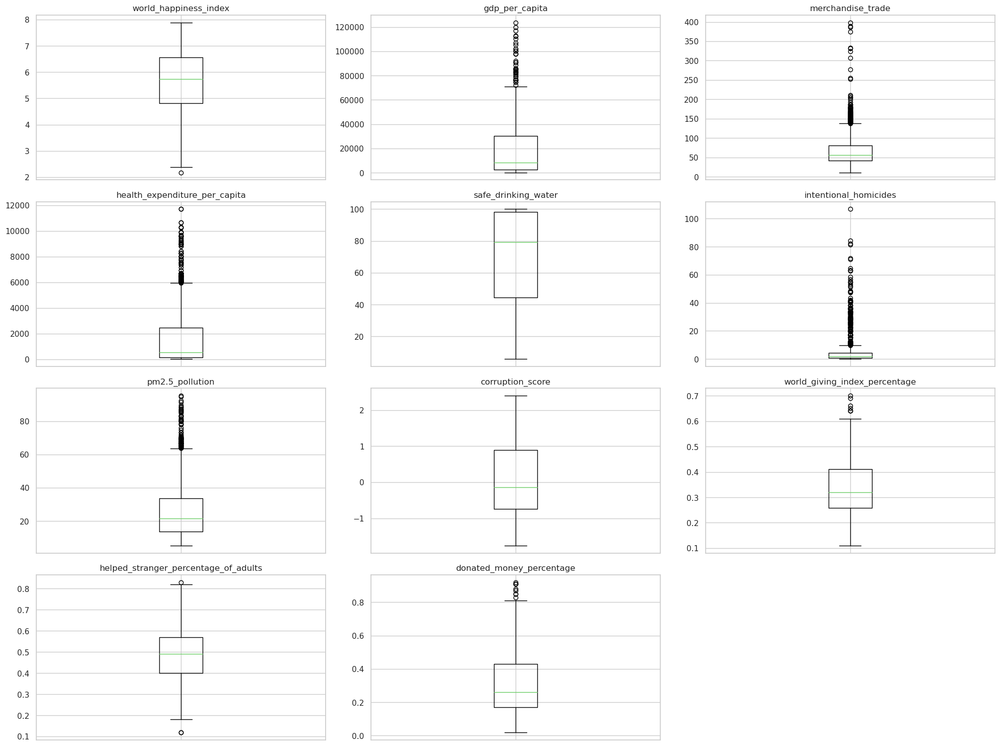

In [93]:
## All Box Plots

# Exclude columns with dtype 'object' and the 'year' column
numeric_columns = all_data_2.select_dtypes(include=['float64', 'int64']).columns.drop('year', errors='ignore')

# Prepare a 4x3 grid for the box plots
fig, axs = plt.subplots(4, 3, figsize=(20, 15))

# Flatten the Axes array for easy iterating
axs = axs.ravel()

# Plot a box plot for each numeric column up to the number of available subplots
for i, column in enumerate(numeric_columns):
    if i < len(axs):  # Ensure we do not go out of bounds
        axs[i].boxplot(all_data_2[column].dropna())
        axs[i].set_title(column)
        axs[i].set_xticklabels([''])  # Set an empty string for x-tick labels
    else:
        break  # Exit the loop if there are no more axes to plot on

# Hide any remaining axes without data
for j in range(i, len(axs)):
    axs[j].set_visible(False)

# Adjust the layout
plt.tight_layout()
plt.show()

/tmp/ipykernel_224/4201328574.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_224/4201328574.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/tmp/ipykernel_224/4201328574.py:24: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



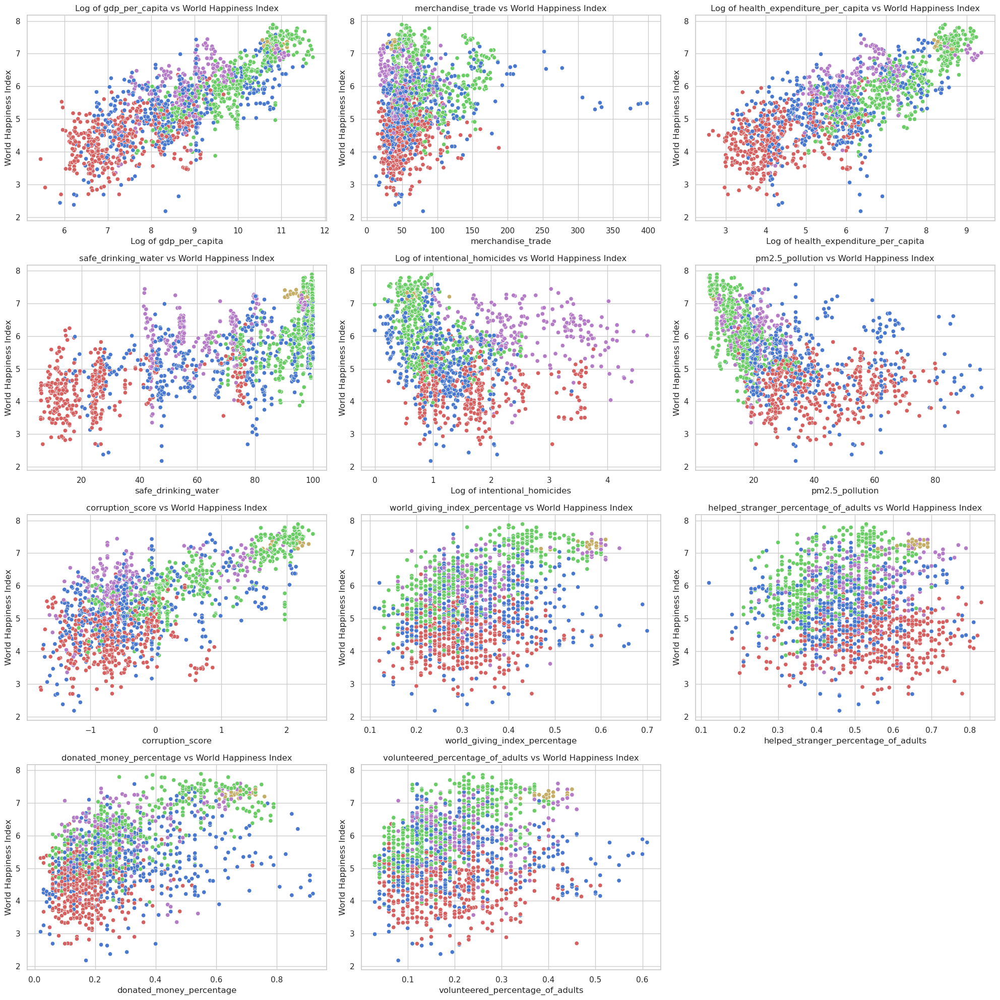

In [94]:
## All Scatterplots

# Define columns that need log transformation
log_columns = ['gdp_per_capita', 'health_expenditure_per_capita', 'intentional_homicides']

# Filter out non-numeric columns, the "year" column, and 'world_happiness_index'
numeric_columns = all_data_2.select_dtypes(include=['float64', 'int64']).columns.drop(['year', 'world_happiness_index'], errors='ignore')

# Calculate the number of rows needed for the Nx3 layout
num_plots = len(numeric_columns)
num_rows = (num_plots // 3) + (num_plots % 3 > 0)

# Prepare the Nx3 grid for the scatter plots
fig, axs = plt.subplots(num_rows, 3, figsize=(20, 5 * num_rows))

# Flatten the Axes array for easy iterating
axs = axs.ravel()

# Plot a scatter plot for each numeric column against world_happiness_index
for i, column in enumerate(numeric_columns):
    ax = axs[i]
    if column in log_columns:
        # Apply logarithmic transformation to the x-axis
        all_data_2[column] = np.log1p(all_data_2[column])  # Use log1p to handle zero values in the data
    sns.scatterplot(ax=ax, data=all_data_2, x=column, y='world_happiness_index', hue='region_name', legend=False)
    ax.set_title(f'Log of {column} vs World Happiness Index' if column in log_columns else f'{column} vs World Happiness Index')
    ax.set_xlabel(f'Log of {column}' if column in log_columns else column)
    ax.set_ylabel('World Happiness Index')

# Turn off any excess plots
for i in range(num_plots, num_rows * 3):
    axs[i].axis('off')

# Add a legend in the last cell if it's empty
if num_plots % 3 != 2:
    handles, labels = axs[0].get_legend_handles_labels()
    axs[-1].legend(handles, labels, loc='center', title='Region Name')
    axs[-1].axis('off')

plt.tight_layout()
plt.show()

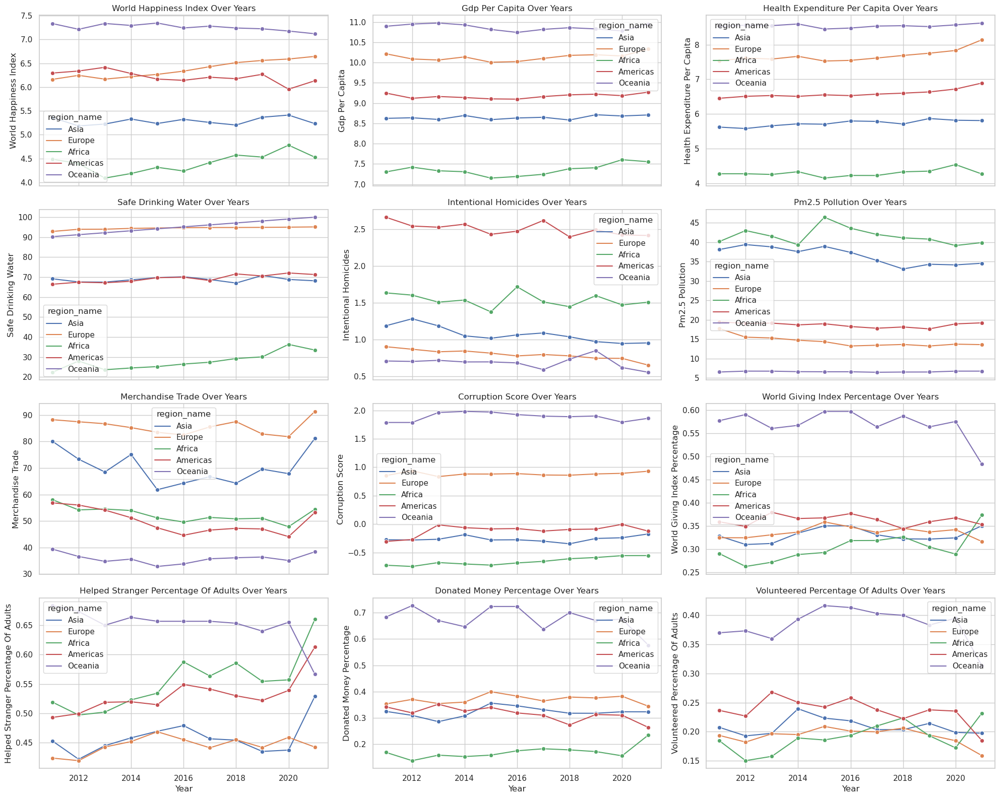

In [95]:
## All line trends

# Plot configuration
sns.set(style="whitegrid")

# Set up a 4x3 grid of plots
fig, axs = plt.subplots(4, 3, figsize=(20, 16), sharex=True)

variables = [
    'world_happiness_index','gdp_per_capita', 'health_expenditure_per_capita', 'safe_drinking_water',
    'intentional_homicides', 'pm2.5_pollution', 'merchandise_trade',
    'corruption_score', 'world_giving_index_percentage',
    'helped_stranger_percentage_of_adults', 'donated_money_percentage',
    'volunteered_percentage_of_adults'
]

# Flatten the array of axes for easy iteration and plotting
axs = axs.ravel()

# Plot each variable over years
for i, var in enumerate(variables):
    sns.lineplot(ax=axs[i], data=all_data_2, x='year', y=var, hue='region_name', marker='o',errorbar=None)
    axs[i].set_title(f'{var.replace("_", " ").title()} Over Years')
    axs[i].set_xlabel('Year')
    axs[i].set_ylabel(var.replace("_", " ").title())

# Adjust layout and show the plot
plt.tight_layout()
plt.show()

## 6.2 Word Count

In [96]:
import nbformat
import re

def count_words_in_markdown(notebook_path):
    """
    Count the number of words in the markdown cells of a Jupyter Notebook.

    Parameters:
    - notebook_path (str): Path to the Jupyter Notebook file.

    Returns:
    - int: Total number of words in the markdown cells.
    """
    # Load the notebook
    with open(notebook_path, 'r', encoding='utf-8') as notebook_file:
        notebook_content = nbformat.read(notebook_file, as_version=4)

    # Initialize word count
    word_count = 0

    # Iterate through the cells
    for cell in notebook_content['cells']:
        if cell['cell_type'] == 'markdown':
            # Extract text from the markdown cell
            markdown_text = cell['source']

            # Use regex to split the text into words
            words = re.findall(r'\b\w+\b', markdown_text)

            # Update word count
            word_count += len(words)

    return word_count

In [97]:
total_words = count_words_in_markdown('Final Notebook.ipynb') - 701
print('Total number of words in markdown cells is : {}'.format(total_words))

Total number of words in markdown cells is : 1927


# 7. References

Charities Aid Foundation, (2023), "CAF World Giving Index", Available at: https://www.cafonline.org/about-us/research/caf-world-giving-index (Accessed: 08 December 2023).

GlobalDataLab,(2022),"Average household size", Avaiable at:https://globaldatalab.org/areadata/table/hhsize/?levels=1 (Accessed: 08 December 2023). 

Helliwell, J. F., Layard, R., Sachs, J. D., Aknin, L. B., De Neve, J.-E., & Wang, S. (Eds.). (2023). World Happiness Report 2023 (11th ed.). Sustainable Development Solutions Network.

Mhaka, T., (2022), "Corruption: Africa’s undeclared pandemic", Al Jazeera. Available at: https://www.aljazeera.com/opinions/2022/7/2/corruption-africas-undeclared-pandemic (Accessed: 09 December 2023). 

OECD.S,(2022), "Family Database", Available at: https://stats.oecd.org/Index.aspx?DataSetCode=FAMILY (Accessed: 08 December 2023).

OECD,(2023), "Household disposable income (indicator)". Available at: https://data.oecd.org/hha/household-disposable-income.htm(Accessed on 08 December 2023).

The World Bank,(2019), "PM2.5 air pollution, mean annual exposure (micrograms per cubic meter)", Avaiable at: https://data.worldbank.org/indicator/EN.ATM.PM25.MC.M3 (Accessed: 08 December 2023). 

The World Bank,(2020), "Current health expenditure per capita (current US$)", Available at: https://data.worldbank.org/indicator/SH.XPD.CHEX.PC.CD (Accessed: 08 December 2023). 

The World Bank,(2021), "Intentional homicides (per 100,000 people)", Available at: https://data.worldbank.org/indicator/VC.IHR.PSRC.P5 (Accessed: 08 December 2023). 

The World Bank,(2021), "Net official development assistance and official aid received (current US$)", Available at: https://data.worldbank.org/indicator/DT.ODA.ALLD.CD (Accessed: 08 December 2023). 

The World Bank,(2022), "People using safely managed drinking water services (% of population)", Available at: https://data.worldbank.org/indicator/SH.H2O.SMDW.ZS (Accessed: 08 December 2023).

The World Bank,(2022), "Merchandise trade (% of GDP)", Avaiable at: https://data.worldbank.org/indicator/TG.VAL.TOTL.GD.ZS (Accessed: 08 December 2023). 

The World Bank,(2023), "GDP per capita (current US$)", World Bank Open Data. Available at: https://data.worldbank.org/indicator/NY.GDP.PCAP.CD (Accessed: 08 December 2023).

The World Bank,(2023), "Worldwide Governance Indicators", Avaiable at: https://datacatalog.worldbank.org/search/dataset/0038026/Worldwide-Governance-Indicators (Accessed: 08 December 2023)

World Health Organization 2013, "State of Health Financing in the African Region", WHO Regional Office for Africa, Republic of Congo.

# 8. Trello Screenshots

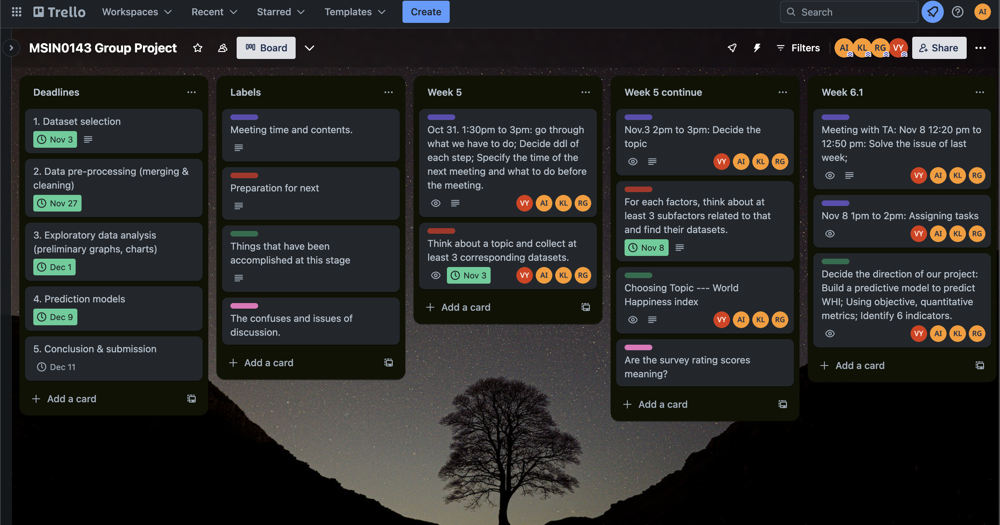

In [98]:
Image("SCR-20231209-r86.png")

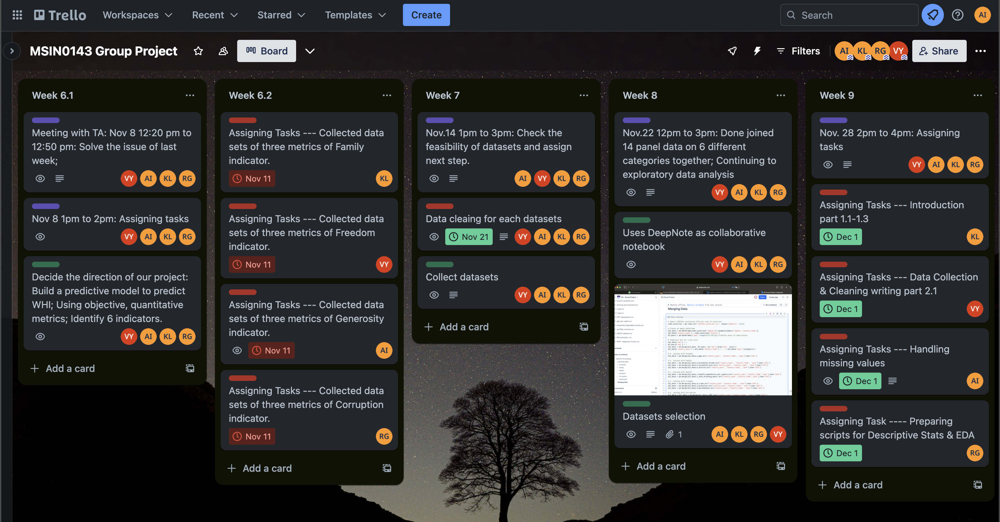

In [99]:
Image("SCR-20231209-r8p.png")

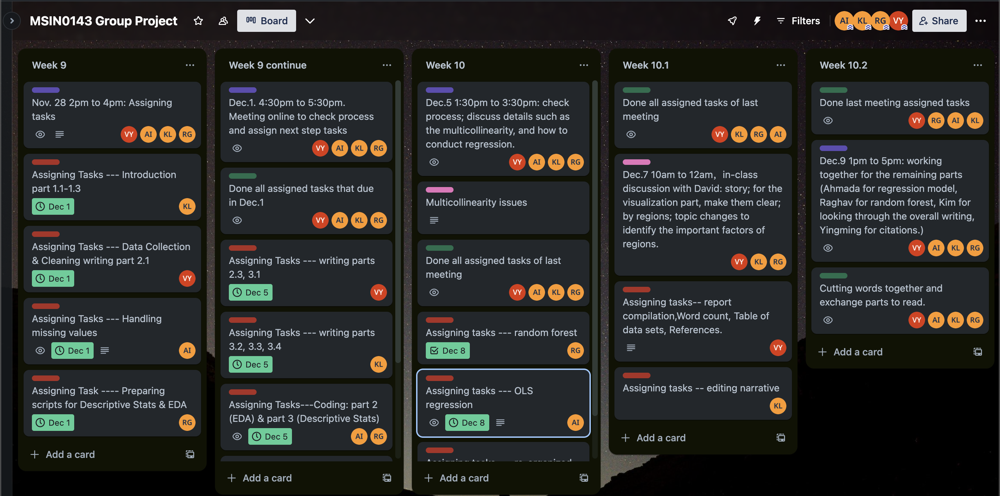

In [100]:
Image("SCR-20231209-r8y.png")

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=eb84e523-7771-4e1e-ba28-503c7dc69404' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>